In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/food41/food_test_c101_n1000_r64x64x3.h5
/kaggle/input/food41/food_c101_n10099_r32x32x3.h5
/kaggle/input/food41/food_c101_n1000_r384x384x3.h5
/kaggle/input/food41/food_test_c101_n1000_r128x128x3.h5
/kaggle/input/food41/food_test_c101_n1000_r32x32x3.h5
/kaggle/input/food41/food_test_c101_n1000_r32x32x1.h5
/kaggle/input/food41/food_test_c101_n1000_r128x128x1.h5
/kaggle/input/food41/food_c101_n10099_r64x64x1.h5
/kaggle/input/food41/food_c101_n10099_r64x64x3.h5
/kaggle/input/food41/food_test_c101_n1000_r64x64x1.h5
/kaggle/input/food41/food_c101_n10099_r32x32x1.h5
/kaggle/input/food41/meta/meta/test.txt
/kaggle/input/food41/meta/meta/train.json
/kaggle/input/food41/meta/meta/labels.txt
/kaggle/input/food41/meta/meta/test.json
/kaggle/input/food41/meta/meta/train.txt
/kaggle/input/food41/meta/meta/classes.txt
/kaggle/input/food41/images/macarons/2428554.jpg
/kaggle/input/food41/images/macarons/3842133.jpg
/kaggle/input/food41/images/macarons/1963752.jpg
/kaggle/input/food41/imag

In [12]:
# re-arrange the dataset
!mkdir /kaggle/working/testset
fl = open('/kaggle/input/food41/meta/meta/classes.txt')
cls = fl.readline()
while(cls):
    !mkdir /kaggle/working/testset/{cls}
    cls = fl.readline()
# Moving test files to testset/, train files will be left.
testfile = open('/kaggle/input/food41/meta/meta/test.txt')
img = testfile.readline().strip()
while(img):
    cls = img.split('/')[0]
    !mv /kaggle/input/food41/images/{img}.jpg /kaggle/working/testset/{cls}/
    print(f'\r{img}',end='')
    img = testfile.readline().strip()

mv: cannot remove '/kaggle/input/food41/images/apple_pie/1011328.jpg': Read-only file system
apple_pie/1011328mv: cannot remove '/kaggle/input/food41/images/apple_pie/101251.jpg': Read-only file system
apple_pie/101251mv: cannot remove '/kaggle/input/food41/images/apple_pie/1034399.jpg': Read-only file system
apple_pie/1034399mv: cannot remove '/kaggle/input/food41/images/apple_pie/103801.jpg': Read-only file system
apple_pie/103801mv: cannot remove '/kaggle/input/food41/images/apple_pie/1038694.jpg': Read-only file system
apple_pie/1038694mv: cannot remove '/kaggle/input/food41/images/apple_pie/1047447.jpg': Read-only file system
apple_pie/1047447mv: cannot remove '/kaggle/input/food41/images/apple_pie/1068632.jpg': Read-only file system
apple_pie/1068632mv: cannot remove '/kaggle/input/food41/images/apple_pie/110043.jpg': Read-only file system
apple_pie/110043mv: cannot remove '/kaggle/input/food41/images/apple_pie/1106961.jpg': Read-only file system
apple_pie/1106961mv: cannot remov

In [36]:
import os
os.listdir('/kaggle/working')
!zip -r testset.zip /kaggle/working

  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/testset/ (stored 0%)
  adding: kaggle/working/testset/falafel/ (stored 0%)
  adding: kaggle/working/testset/falafel/1189019.jpg (deflated 6%)
  adding: kaggle/working/testset/falafel/1327326.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/1886374.jpg (deflated 1%)
  adding: kaggle/working/testset/falafel/3376916.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/2705875.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/1104277.jpg (deflated 1%)
  adding: kaggle/working/testset/falafel/316423.jpg (deflated 1%)
  adding: kaggle/working/testset/falafel/3785034.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/2467198.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/1104779.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/156683.jpg (deflated 0%)
  adding: kaggle/working/testset/falafel/1684735.jpg (deflated 1%)
  adding: kaggle/working/testset/falafel/582266.jpg (deflate

In [37]:
!nvidia-smi

Thu Dec  9 09:29:50 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.119.04   Driver Version: 450.119.04   CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    33W / 250W |   3331MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [15]:
!pip install torch-lr-finder

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
import torch
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision.models.resnet import resnet50

In [17]:
train_transforms = torchvision.transforms.Compose([
        torchvision.transforms.ColorJitter(brightness=0.1,contrast=0.1,saturation=0.1),
        torchvision.transforms.RandomAffine(15),
        torchvision.transforms.RandomHorizontalFlip(),
        torchvision.transforms.RandomRotation(15),
        torchvision.transforms.Resize((224,224)),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])
valid_transforms = torchvision.transforms.Compose([
        torchvision.transforms.Resize((224,224)),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
])

In [18]:
import os
os.listdir('./')

['testset', '__notebook_source__.ipynb']

In [19]:
train_dataset = torchvision.datasets.ImageFolder('../input/food41/images/',transform=train_transforms)
valid_dataset = torchvision.datasets.ImageFolder('./testset/',transform=valid_transforms)

In [20]:
batch_size = 128
train_loader = torch.utils.data.DataLoader(train_dataset,batch_size,shuffle=True,num_workers=2,pin_memory=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset,batch_size,shuffle=False,num_workers=2,pin_memory=True)

In [21]:
def visualize_images(dataloader):
    mean=np.array([0.485, 0.456, 0.406])
    std=np.array([0.229, 0.224, 0.225])
    figure, ax = plt.subplots(nrows=3, ncols=3, figsize=(12, 14))
    classes = list(dataloader.dataset.class_to_idx.keys())
    img_no = 0
    for images,labels in dataloader:
        for i in range(3):
            for j in range(3):
                img = np.array(images[img_no]).transpose(1,2,0)
                lbl = labels[img_no]

                ax[i,j].imshow((img*std) + mean)
                ax[i,j].set_title(classes[lbl])
                ax[i,j].set_axis_off()
                img_no+=1
        break

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

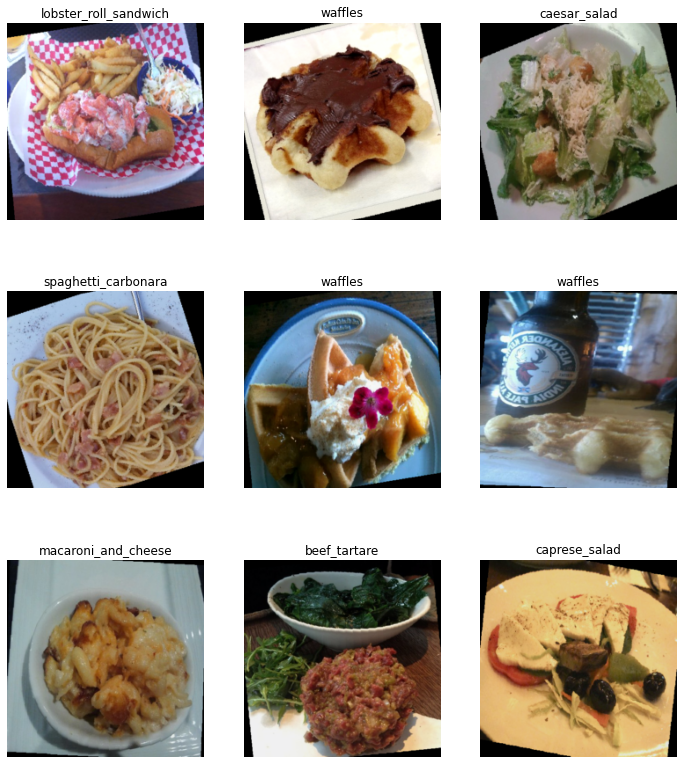

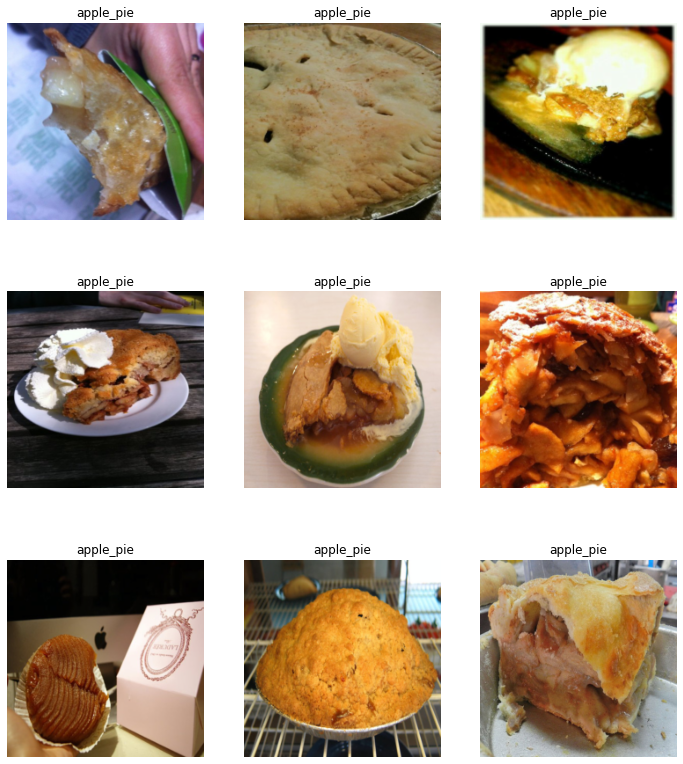

In [22]:
visualize_images(train_loader)

visualize_images(valid_loader)

model = resnet50(pretrained=True)
#model_save = torch.save(model, './resnet50_model_new.pt')
model

In [23]:
# Freeze first few layers. You can try different values instead of 100
for i,param in enumerate(model.parameters()):
    if i<100:
        param.requires_grad=False

In [24]:
model.fc = torch.nn.Sequential(
    torch.nn.Dropout(0.5),
    torch.nn.Linear(2048,101)
)

  0%|          | 0/25 [00:00<?, ?it/s]

Learning rate search finished. See the graph with {finder_name}.plot()
LR suggestion: steepest gradient
Suggested LR: 3.83E-04


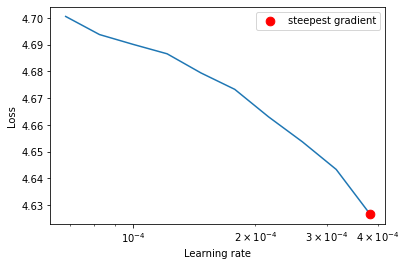

In [38]:
from torch_lr_finder import LRFinder
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.00001)
lr_finder = LRFinder(model, optimizer, criterion, device="cuda")
lr_finder.range_test(train_loader, end_lr=0.001, num_iter=25)
lr_finder.plot()
lr_finder.reset()

In [39]:
%reload_ext tensorboard
%tensorboard --logdir runs

In [ ]:
cuda = True
epochs = 10
# model_name = '/content/drive/My Drive/resnet50.pt'
model_name = './resnet50_model_new.pt'
optimizer = torch.optim.Adam(model.parameters(),lr=4e-5,weight_decay=0.001)
criterion = torch.nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min',factor=0.1,patience=1,verbose=True)

writer = SummaryWriter() # For Tensorboard
early_stop_count=0
ES_patience=5
best = 0.0
if cuda:
    model.cuda()

for epoch in range(epochs):
    
    # Training
    model.train()
    correct = 0
    train_loss = 0.0
    tbar = tqdm(train_loader, desc = 'Training', position=0, leave=True)
    for i,(inp,lbl) in enumerate(tbar):
        optimizer.zero_grad()
        if cuda:
            inp,lbl = inp.cuda(),lbl.cuda()
        out = model(inp)
        loss = criterion(out,lbl)
        train_loss += loss
        out = out.argmax(dim=1)
        correct += (out == lbl).sum().item()
        loss.backward()
        optimizer.step()
        tbar.set_description(f"Epoch: {epoch+1}, loss: {loss.item():.5f}, acc: {100.0*correct/((i+1)*train_loader.batch_size):.4f}%")
    train_acc = 100.0*correct/len(train_loader.dataset)
    train_loss /= (len(train_loader.dataset)/batch_size)

    # Validation
    model.eval()
    with torch.no_grad():
        correct = 0
        val_loss = 0.0
        vbar = tqdm(valid_loader, desc = 'Validation', position=0, leave=True)
        for i,(inp,lbl) in enumerate(vbar):
            if cuda:
                inp,lbl = inp.cuda(),lbl.cuda()
            out = model(inp)
            val_loss += criterion(out,lbl)
            out = out.argmax(dim=1)
            correct += (out == lbl).sum().item()
        val_acc = 100.0*correct/len(valid_loader.dataset)
        val_loss /= (len(valid_loader.dataset)/batch_size)
    print(f'\nEpoch: {epoch+1}/{epochs}')
    print(f'Train loss: {train_loss}, Train Accuracy: {train_acc}')
    print(f'Validation loss: {val_loss}, Validation Accuracy: {val_acc}\n')

    scheduler.step(val_loss)

    # write to tensorboard
    writer.add_scalar("Loss/train", train_loss, epoch)
    writer.add_scalar("Loss/val", val_loss, epoch)
    writer.add_scalar("Accuracy/train", train_acc, epoch)
    writer.add_scalar("Accuracy/val", val_acc, epoch)

    if val_acc>best:
        best=val_acc
        torch.save(model,model_name)
        early_stop_count=0
        print('Accuracy Improved, model saved.\n')
    else:
        early_stop_count+=1

    if early_stop_count==ES_patience:
        print('Early Stopping Initiated...')
        print(f'Best Accuracy achieved: {best:.2f}% at epoch:{epoch-ES_patience}')
        print(f'Model saved as {model_name}')
        break
    writer.flush()
# writer.close()

Validation: 100%|██████████| 198/198 [02:28<00:00,  1.34it/s]



Epoch: 1/10
Train loss: 2.322899341583252, Train Accuracy: 48.5019801980198
Validation loss: 1.0425965785980225, Validation Accuracy: 74.53465346534654

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:27<00:00,  1.34it/s]



Epoch: 2/10
Train loss: 1.175921082496643, Train Accuracy: 70.65049504950495
Validation loss: 0.6974143981933594, Validation Accuracy: 81.9920792079208

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:28<00:00,  1.33it/s]



Epoch: 3/10
Train loss: 0.9148201942443848, Train Accuracy: 76.5009900990099
Validation loss: 0.5385808348655701, Validation Accuracy: 86.06336633663366

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:29<00:00,  1.33it/s]



Epoch: 4/10
Train loss: 0.7654529809951782, Train Accuracy: 80.08514851485148
Validation loss: 0.42712387442588806, Validation Accuracy: 88.86336633663366

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:25<00:00,  1.36it/s]



Epoch: 5/10
Train loss: 0.6539652347564697, Train Accuracy: 82.92772277227722
Validation loss: 0.36660581827163696, Validation Accuracy: 90.26534653465346

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:25<00:00,  1.36it/s]



Epoch: 6/10
Train loss: 0.5679528117179871, Train Accuracy: 85.05445544554455
Validation loss: 0.29040247201919556, Validation Accuracy: 92.36831683168317

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:25<00:00,  1.36it/s]



Epoch: 7/10
Train loss: 0.49573418498039246, Train Accuracy: 86.99108910891088
Validation loss: 0.2573307156562805, Validation Accuracy: 93.26336633663367

Accuracy Improved, model saved.



Validation: 100%|██████████| 198/198 [02:26<00:00,  1.35it/s]



Epoch: 8/10
Train loss: 0.43164366483688354, Train Accuracy: 88.64356435643565
Validation loss: 0.21368345618247986, Validation Accuracy: 94.36435643564356

Accuracy Improved, model saved.



Epoch: 9, loss: 0.44083, acc: 90.6337%:  11%|█▏        | 90/790 [02:47<18:35,  1.59s/it]